In [1]:
# # This mounts your Google Drive to the Colab VM.
# from google.colab import drive
# drive.mount('/content/drive')

# # TODO: Enter the foldername in your Drive where you have saved the unzipped
# # assignment folder, e.g. 'cs231n/assignments/assignment3/'
# FOLDERNAME = None
# assert FOLDERNAME is not None, "[!] Enter the foldername."

# # Now that we've mounted your Drive, this ensures that
# # the Python interpreter of the Colab VM can load
# # python files from within it.
# import sys
# sys.path.append('/content/drive/My Drive/{}'.format(FOLDERNAME))

# # This downloads the COCO dataset to your Drive
# # if it doesn't already exist.
# %cd /content/drive/My\ Drive/$FOLDERNAME/cs231n/datasets/
# !bash get_datasets.sh
# %cd /content/drive/My\ Drive/$FOLDERNAME

# Network Visualization

In this notebook, we will explore the use of *image gradients* for generating new images.
- 이번 챕터에서는, 우리는 경사하강법 하는 동안에 이미지를 시각적으로 나타낼 것이다.

When training a model, we define a loss function which measures our current unhappiness with the model's performance. We then use backpropagation to compute the gradient of the loss with respect to the model parameters and perform gradient descent on the model parameters to minimize the loss.
- 모델을 훈련할 때, 우리는 모델의 성능에 대한 현재의 불행을 측정하는 손실 함수를 정의합니다. 그런 다음 역전파를 사용하여 모델 매개 변수에 대한 손실의 기울기를 계산하고 손실을 최소화하기 위해 모델 매개 변수에 대해 기울기 강하를 수행합니다.

Here we will do something slightly different. We will start from a CNN model which has been pretrained to perform image classification on the ImageNet dataset. We will use this model to define a loss function which quantifies our current unhappiness with our image. Then we will use backpropagation to compute the gradient of this loss with respect to the pixels of the image. We will then keep the model fixed and perform gradient descent *on the image* to synthesize a new image which minimizes the loss.
- 여기서 우리는 약간 다른 작업을 수행할 것입니다. 우리는 ImageNet 데이터 세트에서 이미지 분류를 수행하도록 사전 교육된 CNN 모델에서 시작할 것입니다. 이 모델을 사용하여 이미지에 대한 현재의 불행을 정량화하는 손실 함수를 정의할 것입니다. 그런 다음 역전파를 사용하여 이미지의 픽셀에 대한 손실의 기울기를 계산할 것입니다. 그런 다음 모델을 고정한 상태로 유지하고 이미지에 *구배 하강을 수행하여 손실을 최소화하는 새 이미지를 합성할 것입니다.


We will explore three techniques for image generation.
- 우리는 이미지 생성을 위한 세 가지 기술을 탐구할 것입니다.

**Saliency Maps.** We can use saliency maps to tell which part of the image influenced the classification decision made by the network.
- **Saliency Maps.** 우리는 Saliency Maps를 사용하여 이미지의 어떤 부분이 네트워크의 분류 결정에 영향을 미쳤는지 알 수 있습니다.

**Fooling Images.** We can perturb an input image so that it appears the same to humans but will be misclassified by the pretrained network.
- **Fooling Images.** 입력된 이미지가 사람에게 동일하게 나타나지만 사전 훈련된 네트워크에 의해 잘못 분류되도록 우리는 입력된 이미지를 동요시킬 수 있습니다.

**Class Visualization.** We can synthesize an image to maximize the classification score of a particular class; this can give us some sense of what the network is looking for when it classifies images of that class.
- **Class Visualization.** 특정 클래스의 분류 점수를 최대화하기 위해 이미지를 합성할 수 있습니다. 이를 통해 네트워크가 해당 클래스의 이미지를 분류할 때 무엇을 찾고 있는지 알 수 있습니다.

In [2]:
# Setup cell.
import torch
import torchvision
import numpy as np
import random
import matplotlib.pyplot as plt
from PIL import Image
from cs231n.image_utils import SQUEEZENET_MEAN, SQUEEZENET_STD
from cs231n.net_visualization_pytorch import *

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # Set default size of plots.
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

%load_ext autoreload
%autoreload 2

# Pretrained Model

For all of our image generation experiments, we will start with a convolutional neural network which was pretrained to perform image classification on ImageNet. We can use any model here, but for the purposes of this assignment we will use SqueezeNet [1], which achieves accuracies comparable to AlexNet but with a significantly reduced parameter count and computational complexity.

Using SqueezeNet rather than AlexNet or VGG or ResNet means that we can easily perform all image generation experiments on CPU.

[1] Iandola et al, "SqueezeNet: AlexNet-level accuracy with 50x fewer parameters and < 0.5MB model size", arXiv 2016

In [3]:
# Download and load the pretrained SqueezeNet model.
model = torchvision.models.squeezenet1_1(pretrained=True)

print(model)

# We don't want to train the model, so tell PyTorch not to compute gradients
# with respect to model parameters.
for param in model.parameters():
    param.requires_grad = False

SqueezeNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
    (3): Fire(
      (squeeze): Conv2d(64, 16, kernel_size=(1, 1), stride=(1, 1))
      (squeeze_activation): ReLU(inplace=True)
      (expand1x1): Conv2d(16, 64, kernel_size=(1, 1), stride=(1, 1))
      (expand1x1_activation): ReLU(inplace=True)
      (expand3x3): Conv2d(16, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (expand3x3_activation): ReLU(inplace=True)
    )
    (4): Fire(
      (squeeze): Conv2d(128, 16, kernel_size=(1, 1), stride=(1, 1))
      (squeeze_activation): ReLU(inplace=True)
      (expand1x1): Conv2d(16, 64, kernel_size=(1, 1), stride=(1, 1))
      (expand1x1_activation): ReLU(inplace=True)
      (expand3x3): Conv2d(16, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (expand3x3_activation): ReLU(inplace=True)
    )
    (5): MaxPool2d

/Users/kim-seung-gyeom/opt/anaconda3/envs/ml/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/kim-seung-gyeom/opt/anaconda3/envs/ml/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=SqueezeNet1_1_Weights.IMAGENET1K_V1`. You can also use `weights=SqueezeNet1_1_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


## Loading ImageNet Validation Images
We have provided a few example images from the validation set of the ImageNet ILSVRC 2012 Classification dataset. Since they come from the validation set, our pretrained model did not see these images during training. Run the following cell to visualize some of these images along with their ground-truth labels.

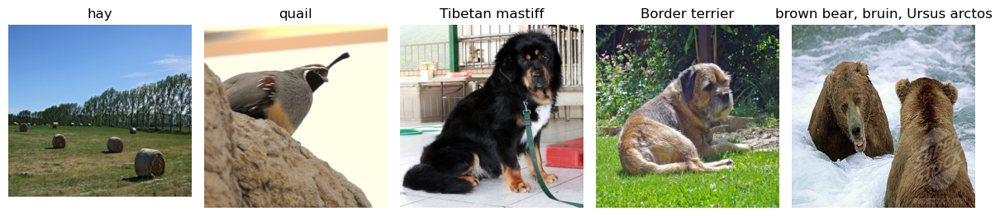

In [4]:
from cs231n.data_utils import load_imagenet_val
X, y, class_names = load_imagenet_val(num=5)

plt.figure(figsize=(12, 6))
for i in range(5):
    plt.subplot(1, 5, i + 1)
    plt.imshow(X[i])
    plt.title(class_names[y[i]])
    plt.axis('off')
plt.gcf().tight_layout()

# Saliency Maps
Using this pretrained model, we will compute class saliency maps as described in Section 3.1 of [2].

A **saliency map** tells us the degree to which each pixel in the image affects the classification score for that image. To compute it, we compute the gradient of the unnormalized score corresponding to the correct class (which is a scalar) with respect to the pixels of the image. If the image has shape `(3, H, W)` then this gradient will also have shape `(3, H, W)`; for each pixel in the image, this gradient tells us the amount by which the classification score will change if the pixel changes by a small amount. To compute the saliency map, we take the absolute value of this gradient, then take the maximum value over the 3 input channels; the final saliency map thus has shape `(H, W)` and all entries are nonnegative.

- ** saliency map**는 이미지의 각 픽셀이 해당 이미지의 분류 점수에 영향을 미치는 정도를 알려줍니다. 이를 계산하기 위해 이미지의 픽셀에 대해 올바른 클래스(스칼라인)에 해당하는 정규화되지 않은 점수의 기울기를 계산합니다. 이미지가 '(3, H, W)' 모양을 가지면 이 기울기도 '(3, H, W)' 모양을 가질 것입니다. 이미지의 각 픽셀에 대해 이 기울기는 픽셀이 작은 양만큼 변하면 분류 점수가 변화하는 양을 알려줍니다. saliency map을 계산하기 위해 이 기울기의 절대값을 취한 다음 3개의 입력 채널에 대해 최대값을 얻습니다. 따라서 최종 saliency map은 '(H, W)' 모양을 가지며 모든 항목은 음수가 아닙니다.

[2] Karen Simonyan, Andrea Vedaldi, and Andrew Zisserman. "Deep Inside Convolutional Networks: Visualising
Image Classification Models and Saliency Maps", ICLR Workshop 2014.

### Hint: PyTorch `gather` method
Recall in Assignment 1 you needed to select one element from each row of a matrix; if `s` is an numpy array of shape `(N, C)` and `y` is a numpy array of shape `(N,`) containing integers `0 <= y[i] < C`, then `s[np.arange(N), y]` is a numpy array of shape `(N,)` which selects one element from each element in `s` using the indices in `y`.

In PyTorch you can perform the same operation using the `gather()` method. If `s` is a PyTorch Tensor of shape `(N, C)` and `y` is a PyTorch Tensor of shape `(N,)` containing longs in the range `0 <= y[i] < C`, then

`s.gather(1, y.view(-1, 1)).squeeze()`

will be a PyTorch Tensor of shape `(N,)` containing one entry from each row of `s`, selected according to the indices in `y`.

run the following cell to see an example.

You can also read the documentation for [the gather method](http://pytorch.org/docs/torch.html#torch.gather)
and [the squeeze method](http://pytorch.org/docs/torch.html#torch.squeeze).

In [46]:
# Example of using gather to select one entry from each row in PyTorch
# Gather 특정 인덱스만 추출하기
def gather_example():
    N, C = 4, 5
    s = torch.randn(N, C)
    y = torch.LongTensor([1, 2, 1, 3])
    print(s)
    print(y)
    print(s.gather(1, y.view(-1, 1)).squeeze())
gather_example()

tensor([[-1.6938,  1.5587,  0.1087,  1.3616,  0.4167],
        [-0.4136,  0.8911,  1.6451,  0.2446, -1.4659],
        [ 0.8006, -1.3544,  0.8667,  0.7629,  0.3852],
        [ 0.6814, -0.5681,  0.3434,  0.7881,  0.4442]])
tensor([1, 2, 1, 3])
tensor([ 1.5587,  1.6451, -1.3544,  0.7881])


Implement ```compute_saliency_maps``` function inside ```cs231n/net_visualization_pytorch.py```

Once you have completed the implementation above, run the following to visualize some class saliency maps on our example images from the ImageNet validation set:

In [6]:
a = np.array([
    [[[10,2,3], [3,4,4],[5,6,5]],
    [[1,2,3], [3,4,4],[5,6,5]],
    [[1,2,3], [3,4,4],[5,6,5]]],

    [[[1,2,3], [3,4,4],[5,6,5]],
    [[1,2,3], [3,4,4],[5,6,5]],
    [[1,2,3], [3,4,4],[5,6,5]]]
])
print(a)
a.sum(axis=1)


[[[[10  2  3]
   [ 3  4  4]
   [ 5  6  5]]

  [[ 1  2  3]
   [ 3  4  4]
   [ 5  6  5]]

  [[ 1  2  3]
   [ 3  4  4]
   [ 5  6  5]]]


 [[[ 1  2  3]
   [ 3  4  4]
   [ 5  6  5]]

  [[ 1  2  3]
   [ 3  4  4]
   [ 5  6  5]]

  [[ 1  2  3]
   [ 3  4  4]
   [ 5  6  5]]]]


array([[[12,  6,  9],
        [ 9, 12, 12],
        [15, 18, 15]],

       [[ 3,  6,  9],
        [ 9, 12, 12],
        [15, 18, 15]]])

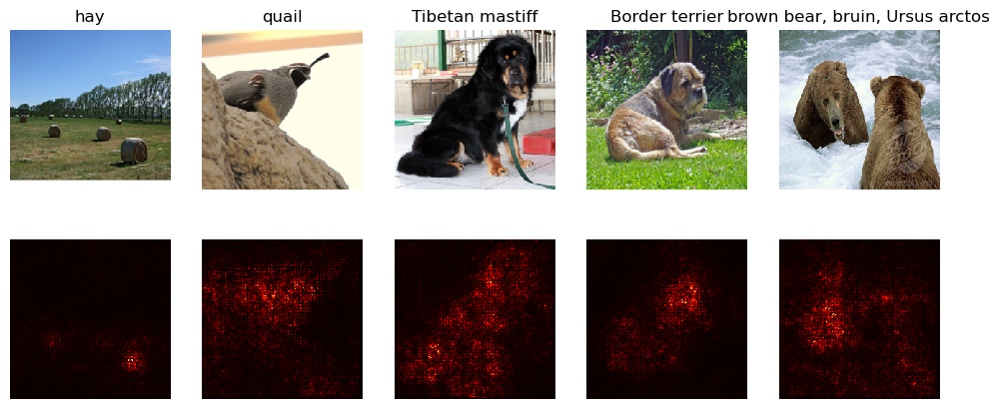

In [44]:
def show_saliency_maps(X, y):
    # Convert X and y from numpy arrays to Torch Tensors
    X_tensor = torch.cat([preprocess(Image.fromarray(x)) for x in X], dim=0)
    y_tensor = torch.LongTensor(y)

    # Compute saliency maps for images in X
    saliency = compute_saliency_maps(X_tensor, y_tensor, model)
    # Convert the saliency map from Torch Tensor to numpy array and show images
    # and saliency maps together.
    saliency = saliency.numpy()
    N = X.shape[0]
    for i in range(N):
        plt.subplot(2, N, i + 1)
        plt.imshow(X[i])
        plt.axis('off')
        plt.title(class_names[y[i]])
        plt.subplot(2, N, N + i + 1)
        plt.imshow(saliency[i], cmap=plt.cm.hot)
        plt.axis('off')
        plt.gcf().set_size_inches(12, 5)
    plt.show()

show_saliency_maps(X, y)

# Fooling Images
We can also use image gradients to generate "fooling images" as discussed in [3]. Given an image and a target class, we can perform gradient **ascent** over the image to maximize the target class, stopping when the network classifies the image as the target class. Implement the following function to generate fooling images.

- 우리는 또한 [3]에서 논의된 바와 같이 "fooling images"를 생성하기 위해 이미지 그래디언트를 사용할 수 있습니다. 이미지와 대상 클래스가 주어지면, 네트워크가 이미지를 대상 클래스로 분류할 때 중지하고, 대상 클래스를 최대화하기 위해 이미지에 대해 그래디언트 **ascent**를 수행할 수 있습니다. 속임 이미지를 생성하기 위해 다음 기능을 구현합니다.

[3] Szegedy et al, "Intriguing properties of neural networks", ICLR 2014

Implement ```make_fooling_image``` function inside ```cs231n/net_visualization_pytorch.py```

Run the following cell to generate a fooling image. You should ideally see at first glance no major difference between the original and fooling images, and the network should now make an incorrect prediction on the fooling one. However you should see a bit of random noise if you look at the 10x magnified difference between the original and fooling images. Feel free to change the `idx` variable to explore other images.

- 다음 셀을 실행하여 속이는 이미지를 생성합니다. 이상적으로 처음에는 원본 이미지와 속이는 이미지 사이에 큰 차이가 없음을 알 수 있어야 하며, 네트워크는 이제 속는 이미지에 대해 잘못된 예측을 해야 합니다. 그러나 원본 이미지와 속이는 이미지 사이에 10배 확대된 차이를 보면 약간의 무작위 노이즈를 볼 수 있습니다. 다른 이미지를 탐색하려면 자유롭게 'idx' 변수를 변경하십시오.

In [81]:
idx = 4
target_y = 4

X_tensor = torch.cat([preprocess(Image.fromarray(x)) for x in X], dim=0)

X_fooling = make_fooling_image(X_tensor[idx:idx+1], target_y, model)

#가상에 이미지 만들었다.
scores = model(X_fooling)
print(scores.data.max(1)[1][0].item())
assert target_y == scores.data.max(1)[1][0].item(), 'The model is not fooled!'

tensor([294])
tensor([150])
tensor([150])
tensor([150])
tensor([150])
tensor([150])
tensor([4])
4


After generating a fooling image, run the following cell to visualize the original image, the fooling image, as well as the difference between them.

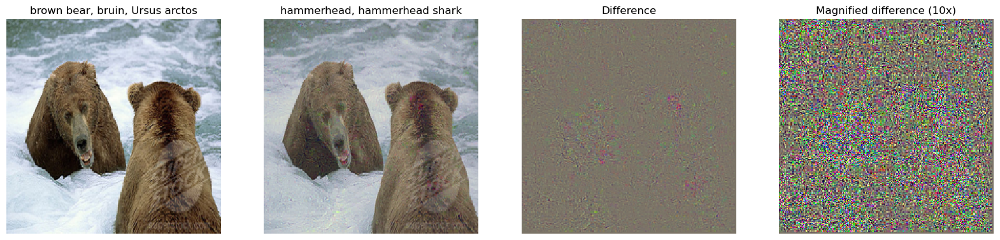

In [83]:
X_fooling_np = deprocess(X_fooling.clone())
X_fooling_np = np.asarray(X_fooling_np).astype(np.uint8)

plt.subplot(1, 4, 1)
plt.imshow(X[idx])
plt.title(class_names[y[idx]])
plt.axis('off')

plt.subplot(1, 4, 2)
plt.imshow(X_fooling_np)
plt.title(class_names[target_y])
plt.axis('off')

plt.subplot(1, 4, 3)
X_pre = preprocess(Image.fromarray(X[idx]))
diff = np.asarray(deprocess(X_fooling - X_pre, should_rescale=False))
plt.imshow(diff)
plt.title('Difference')
plt.axis('off')

plt.subplot(1, 4, 4)
diff = np.asarray(deprocess(10 * (X_fooling - X_pre), should_rescale=False))
plt.imshow(diff)
plt.title('Magnified difference (10x)')
plt.axis('off')

plt.gcf().set_size_inches(20, 5)
plt.show()

# Class Visualization
By starting with a random noise image and performing gradient ascent on a target class, we can generate an image that the network will recognize as the target class. This idea was first presented in [2]; [3] extended this idea by suggesting several regularization techniques that can improve the quality of the generated image.

Concretely, let $I$ be an image and let $y$ be a target class. Let $s_y(I)$ be the score that a convolutional network assigns to the image $I$ for class $y$; note that these are raw unnormalized scores, not class probabilities. We wish to generate an image $I^*$ that achieves a high score for the class $y$ by solving the problem

$$
I^* = \arg\max_I (s_y(I) - R(I))
$$

where $R$ is a (possibly implicit) regularizer (note the sign of $R(I)$ in the argmax: we want to minimize this regularization term). We can solve this optimization problem using gradient ascent, computing gradients with respect to the generated image. We will use (explicit) L2 regularization of the form

$$
R(I) = \lambda \|I\|_2^2
$$

**and** implicit regularization as suggested by [3] by periodically blurring the generated image. We can solve this problem using gradient ascent on the generated image.

[2] Karen Simonyan, Andrea Vedaldi, and Andrew Zisserman. "Deep Inside Convolutional Networks: Visualising
Image Classification Models and Saliency Maps", ICLR Workshop 2014.

[3] Yosinski et al, "Understanding Neural Networks Through Deep Visualization", ICML 2015 Deep Learning Workshop

In `cs231n/net_visualization_pytorch.py` complete the implementation of the `class_visualization_update_step` used in the `create_class_visualization` function below.
Once you have completed that implementation, run the following cells to generate an image of a Tarantula:

In [88]:
def create_class_visualization(target_y, model, dtype, **kwargs):
    """
    Generate an image to maximize the score of target_y under a pretrained model.

    Inputs:
    - target_y: Integer in the range [0, 1000) giving the index of the class
    - model: A pretrained CNN that will be used to generate the image
    - dtype: Torch datatype to use for computations

    Keyword arguments:
    - l2_reg: Strength of L2 regularization on the image
    - learning_rate: How big of a step to take
    - num_iterations: How many iterations to use
    - blur_every: How often to blur the image as an implicit regularizer
    - max_jitter: How much to gjitter the image as an implicit regularizer
    - show_every: How often to show the intermediate result
    """
    model.type(dtype)
    l2_reg = kwargs.pop('l2_reg', 1e-3)
    learning_rate = kwargs.pop('learning_rate', 25)
    num_iterations = kwargs.pop('num_iterations', 100)
    blur_every = kwargs.pop('blur_every', 10)
    max_jitter = kwargs.pop('max_jitter', 16)
    show_every = kwargs.pop('show_every', 25)

    # Randomly initialize the image as a PyTorch Tensor, and make it requires gradient.
    img = torch.randn(1, 3, 224, 224).mul_(1.0).type(dtype).requires_grad_()

    for t in range(num_iterations):
        # Randomly jitter the image a bit; this gives slightly nicer results
        ox, oy = random.randint(0, max_jitter), random.randint(0, max_jitter)
        img.data.copy_(jitter(img.data, ox, oy))
        class_visualization_update_step(img, model, target_y, l2_reg, learning_rate)
        # Undo the random jitter
        img.data.copy_(jitter(img.data, -ox, -oy))

        # As regularizer, clamp and periodically blur the image
        for c in range(3):
            lo = float(-SQUEEZENET_MEAN[c] / SQUEEZENET_STD[c])
            hi = float((1.0 - SQUEEZENET_MEAN[c]) / SQUEEZENET_STD[c])
            img.data[:, c].clamp_(min=lo, max=hi)
        if t % blur_every == 0:
            blur_image(img.data, sigma=0.5)

        # Periodically show the image
        if t == 0 or (t + 1) % show_every == 0 or t == num_iterations - 1:
            plt.imshow(deprocess(img.data.clone().cpu()))
            class_name = class_names[target_y]
            plt.title('%s\nIteration %d / %d' % (class_name, t + 1, num_iterations))
            plt.gcf().set_size_inches(4, 4)
            plt.axis('off')
            plt.show()

    return deprocess(img.data.cpu())

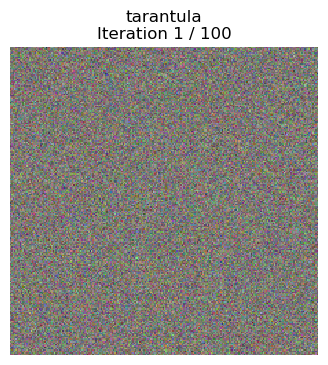

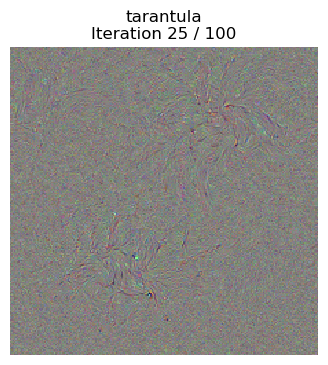

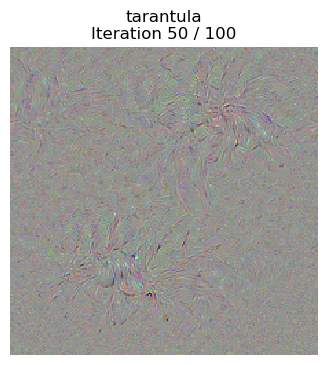

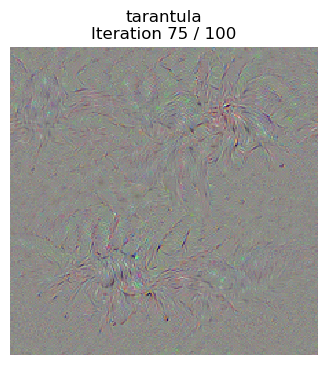

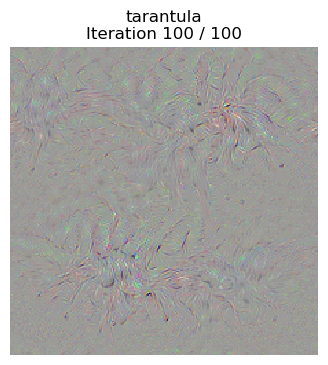

In [89]:
dtype = torch.FloatTensor
model.type(dtype)

target_y = 76 # Tarantula
# target_y = 78 # Tick
# target_y = 187 # Yorkshire Terrier
# target_y = 683 # Oboe
# target_y = 366 # Gorilla
# target_y = 604 # Hourglass
out = create_class_visualization(target_y, model, dtype)

Try out your class visualization on other classes! You should also feel free to play with various hyperparameters to try and improve the quality of the generated image, but this is not required.

gorilla, Gorilla gorilla


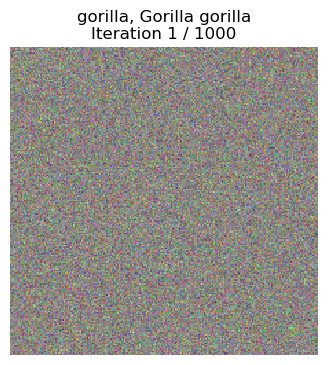

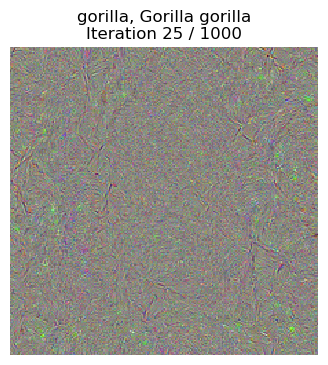

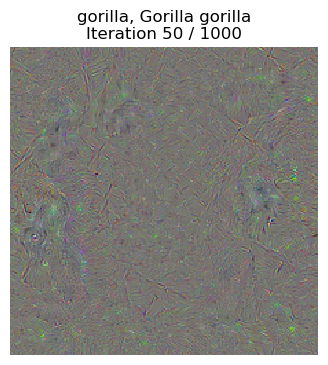

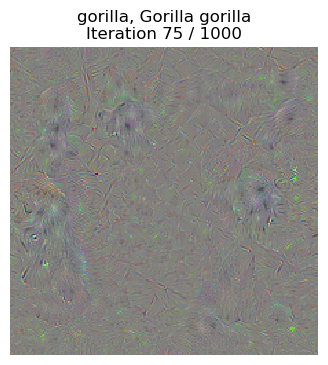

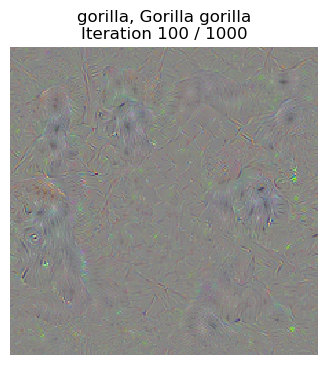

...

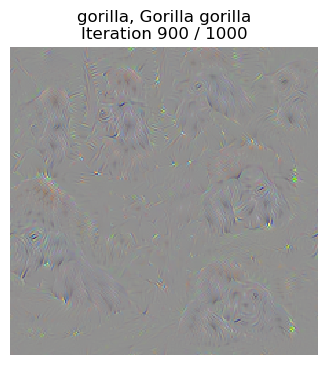

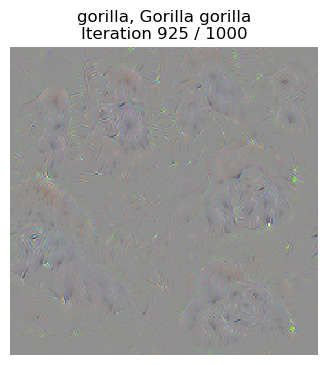

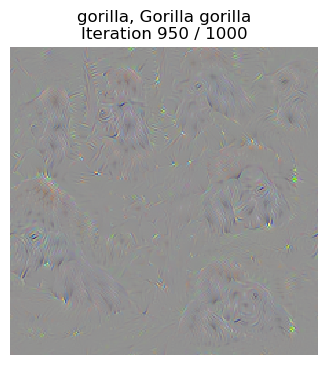

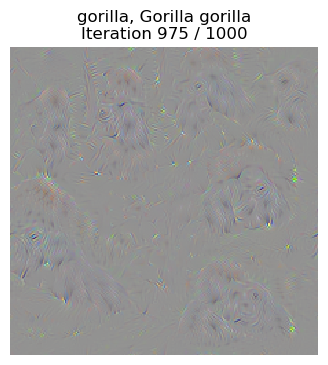

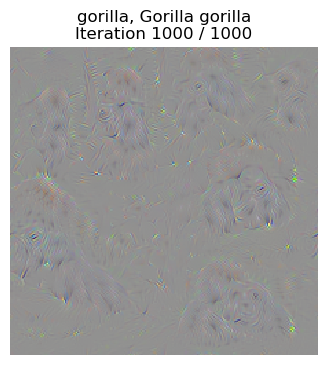

In [90]:
#target_y = 78 # Tick
# target_y = 187 # Yorkshire Terrier
# target_y = 683 # Oboe
target_y = 366 # Gorilla
# target_y = 604 # Hourglass
# target_y = np.random.randint(1000)
print(class_names[target_y])
X = create_class_visualization(target_y, model, dtype, num_iterations=1000)